<a href="https://colab.research.google.com/github/a01137646/ComputerVision/blob/main/1_basic_operations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Maestría en Inteligencia Artificial Aplicada

# TC 4033: Visión computacional para imágenes y video

# Tecnológico de Monterrey

## Dr. Gilberto Ochoa Ruiz

# **2.2 Google Colab - Simple_ImgProcessing**

## **Equipo # 16**
### Edwin David Hernández Alejandre A01794692
### Miguel Guillermo Galindo Orozco A01793695
### Jorge Pedroza Rivera A01319553
### Juan Carlos Alvarado Carricarte A01793486
### Gerardo Aaron Castañeda Jaramillo A01137646





## Table of Contents

1. [Simple Image Operations](#SimpleImageOperations)
* [Libraries](#libraries)
* [Loading Images](#loading)
* [Resizing Images](#resize)
* [Negative Images](#negative)
* [Logarithmic Transformation](#log)
* [Image Binarizer](#bin)
* [Image Quantizer](#quant)
2. [Ejercicios](#Ejercicios)
* [Ejercicio 1](#Ejercicio1)

  a. [Escala de Grises](#Escaladegrises)

  b. [Negativo](#Negativo)

  c. [Brillo](#Brillo)

* [Ejercicio 2](#Ejercicio2)
* [Ejercicio 3](#Ejercicio3)
* [Ejercicio 4](#Ejercicio4)
3. [Referencias](#Referencias)

# **1. Simple Image Operations** <a class="anchor" id="SimpleImageOperations" ></a>

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')


# Habilitar solo si usas un archivo local
import os
DIR = "C:\\Git\\TecMonterrrey\\VisionComputacional\\Equipo\ComputerVision\\data"
os.chdir(DIR)

<>:7: SyntaxWarning: invalid escape sequence '\C'
<>:7: SyntaxWarning: invalid escape sequence '\C'
C:\Users\edwin\AppData\Local\Temp\ipykernel_45636\3369488227.py:7: SyntaxWarning: invalid escape sequence '\C'
  DIR = "C:\\Git\\TecMonterrrey\\VisionComputacional\\Equipo\ComputerVision\\data"


In [2]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


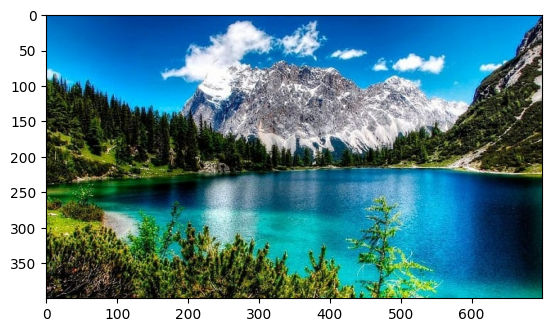

In [3]:
#img1 = mpimg.imread('drive/MyDrive/Vision/data/image.jpg')
img1 = mpimg.imread('C:\\Git\\TecMonterrrey\\VisionComputacional\\Equipo\\ComputerVision\\data\\image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [6]:
img1.shape

(400, 700, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

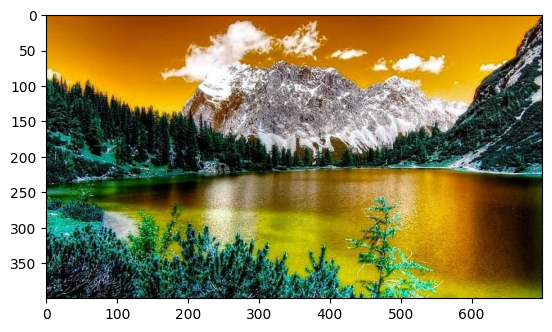

In [7]:
img2 = cv2.imread('drive/MyDrive/Vision/data/image.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB).

Let's fix that

AxesImage(size=(400, 700))


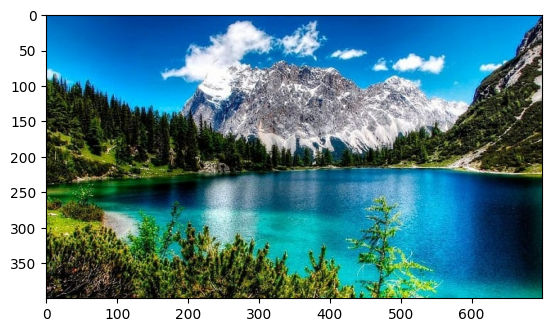

In [8]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


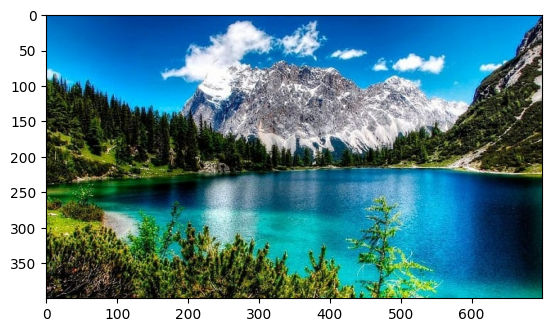

In [9]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('drive/MyDrive/Vision/data/image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [10]:
img3 = np.array(img3)
img3.shape

(400, 700, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

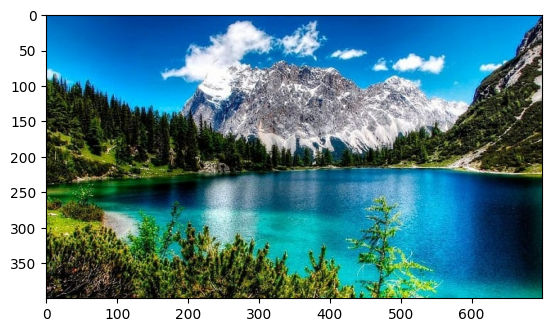

In [11]:
# Save the image
np.save('drive/MyDrive/Vision/data/img.npy', img3)

# Load the image
img3 = np.load('drive/MyDrive/Vision/data/img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it.

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 700 x 400
New size: 200 x 200


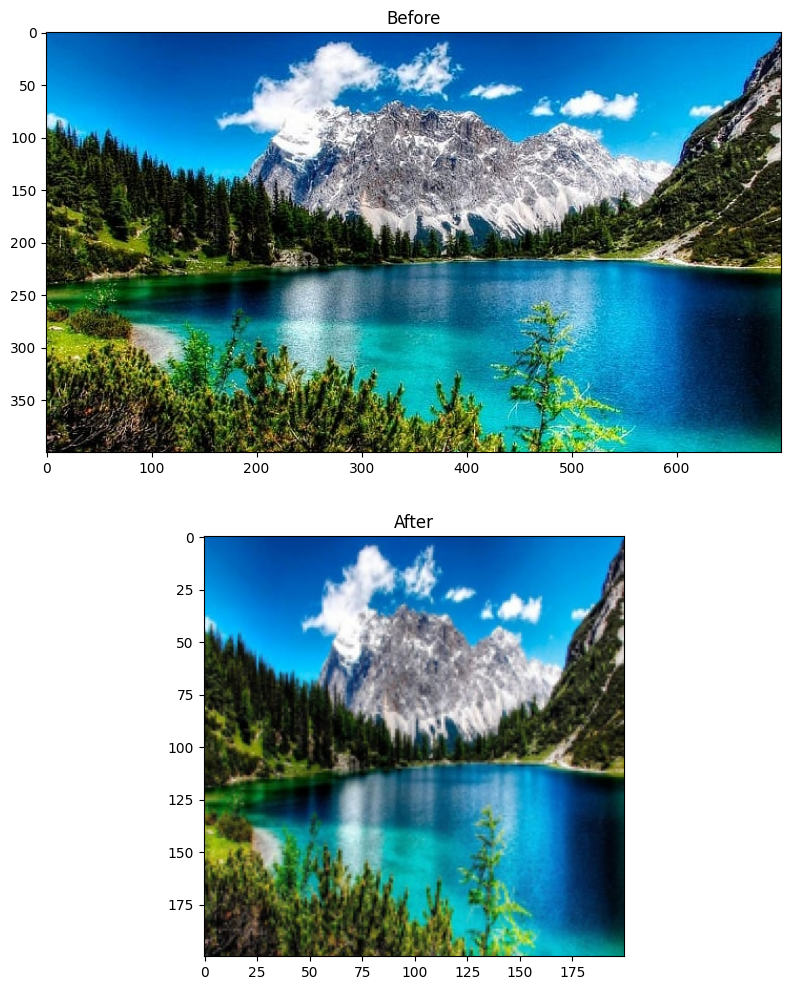

In [12]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 700 x 400
Scaled size: 200 x 114
New size: 200 x 200


<ipython-input-13-7d254277b796>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  scaled_img.thumbnail(target_size, Image.ANTIALIAS)


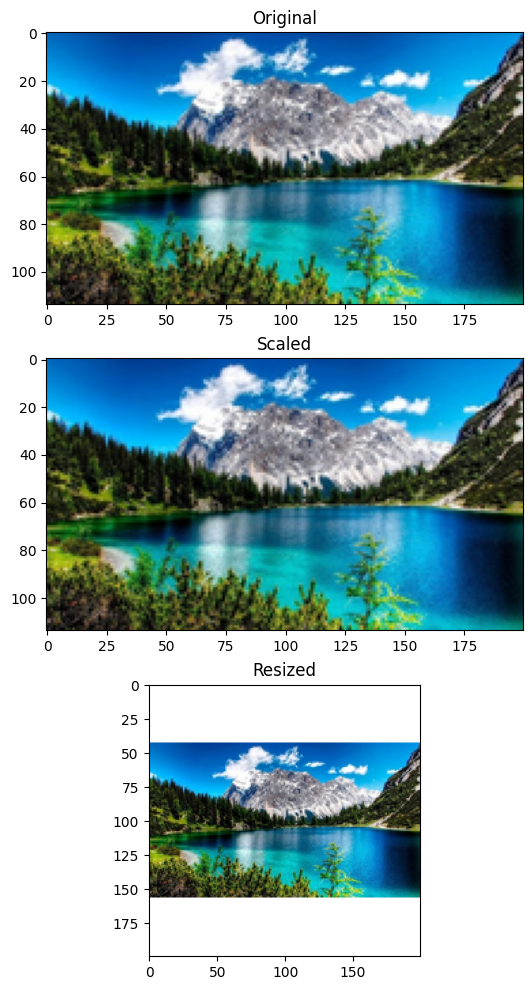

In [13]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.ANTIALIAS)
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

In [14]:
orig_img = cv2.imread('drive/MyDrive/Vision/data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

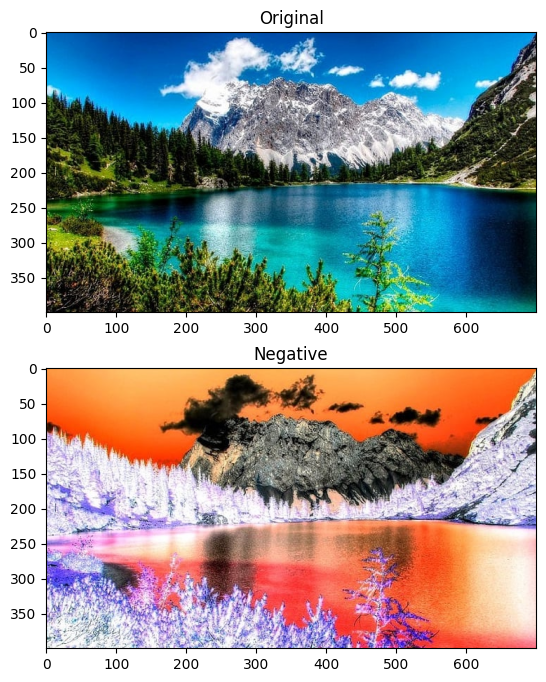

In [15]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [16]:
orig_img = cv2.imread('drive/MyDrive/Vision/data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
c = 255 / np.log(1 + np.max(orig_img))
log_img = c * (np.log(orig_img + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)

<ipython-input-16-8e8b1c22145d>:6: RuntimeWarning: divide by zero encountered in log
  log_img = c * (np.log(orig_img + 1))


Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

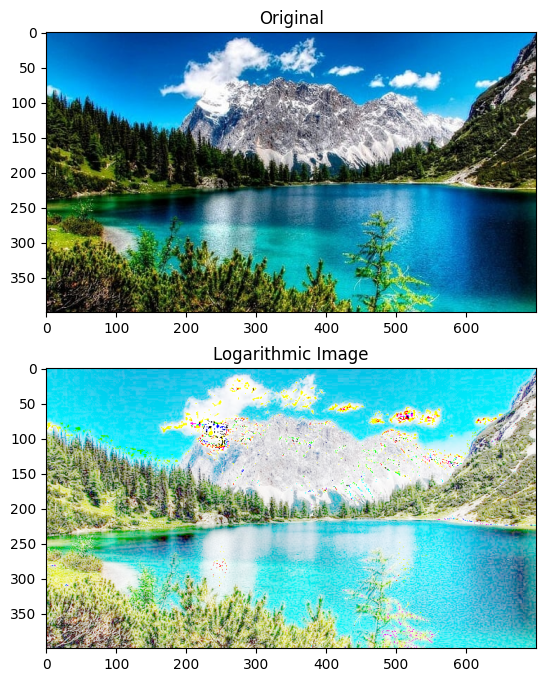

In [17]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

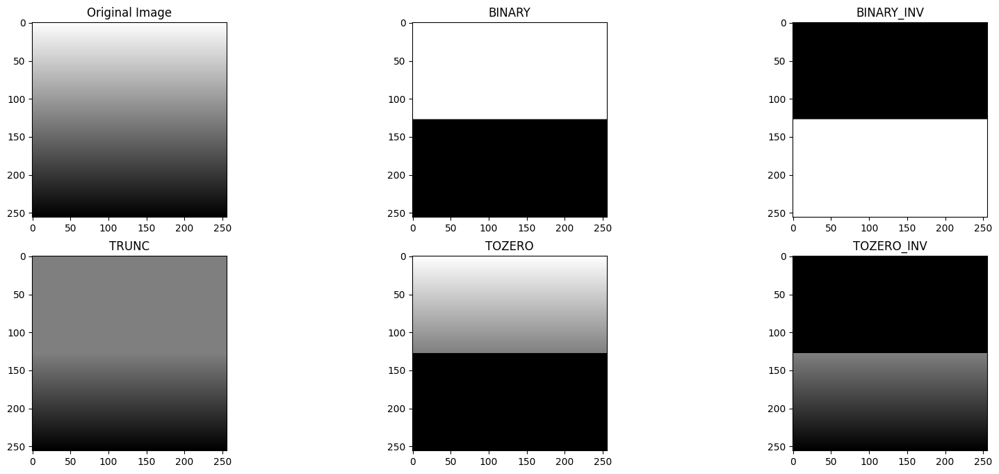

In [18]:
orig_img = cv2.imread('drive/MyDrive/Vision/data/linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

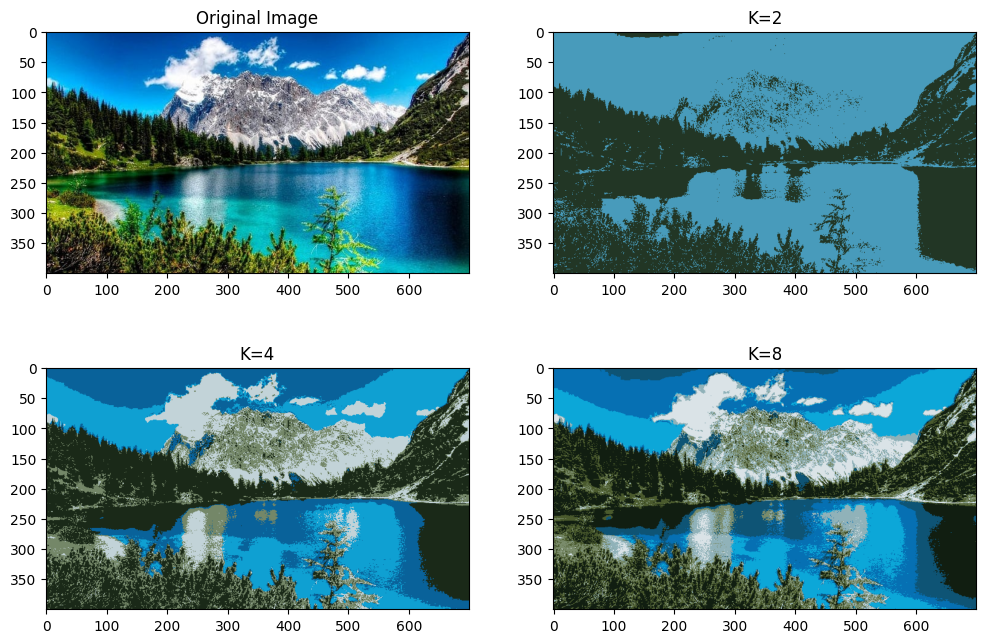

In [19]:
orig_img = cv2.imread('drive/MyDrive/Vision/data/image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

# **2. Ejercicios** <a class="anchor" id="Ejercicios" ></a>

## **Ejercicio 1**<a class="anchor" id="Ejercicio1" ></a>

**Las transformaciones pixel a pixel son sumamente utilizadas para aumentar la cantidad de imágenes para entrenar modelos de inteligencia artificial, sobre todo aquellas de tipo fotométrico. Investiga 3 tipos de transformaciones y aplicarlas en el proyecto de Google Collab sobre imágenes propias.**

Imagen obtenida de internet:

<class 'PIL.JpegImagePlugin.JpegImageFile'> width: 1536 height: 864


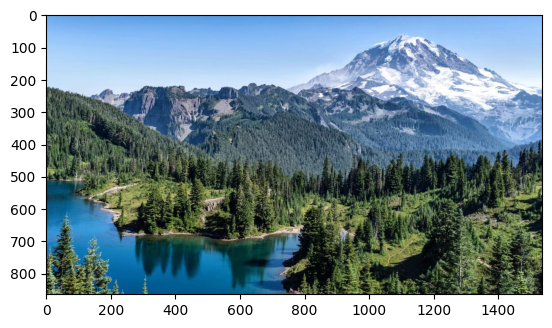

In [20]:
img_orig = Image.open('drive/MyDrive/Vision/data/1.jpg')
plt.imshow(img_orig)
width, height = img_orig.size
print(type(img_orig), 'width:', width, 'height:', height)

### **a. Escala de grises**<a class="anchor" id="Escaladegrises" ></a>

In [21]:
grayscale_image = Image.new('L', (width, height))
for x in range(width):
  for y in range(height):
    pixel = sum(img_orig.getpixel((x, y))) // 3
    grayscale_image.putpixel((x, y), pixel)
grayscale_image.save('drive/MyDrive/Vision/data/1_grayscale.jpg')

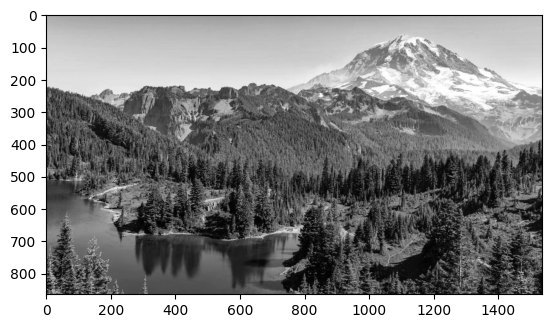

In [22]:
img_grayscale = Image.open('drive/MyDrive/Vision/data/1_grayscale.jpg')
plt.imshow(img_grayscale, cmap='gray')

### **b. Negativo**<a class="anchor" id="Negativo" ></a>

In [23]:
neg_image = Image.new('RGB', (width, height))
for x in range(width):
  for y in range(height):
    r, g, b = img_orig.getpixel((x, y))
    inverted = (255 - r, 255 - g, 255 - b)
    neg_image.putpixel((x, y), inverted)
neg_image.save('drive/MyDrive/Vision/data/1_negative.jpg')

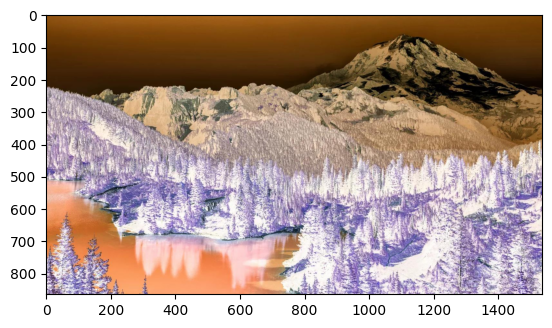

In [24]:
img_negative = Image.open('drive/MyDrive/Vision/data/1_negative.jpg')
plt.imshow(img_negative)

### **c. Brillo**<a class="anchor" id="Brillo" ></a>

In [25]:
bright_image = Image.new('RGB', (width, height))
factor = 0.5
for x in range(width):
  for y in range(height):
    r, g, b = img_orig.getpixel((x, y))
    adjusted = (min(int(r * factor), 255), min(int(g * factor), 255), min(int(b * factor), 255))
    bright_image.putpixel((x, y), adjusted)
bright_image.save('drive/MyDrive/Vision/data/1_brightness.jpg')

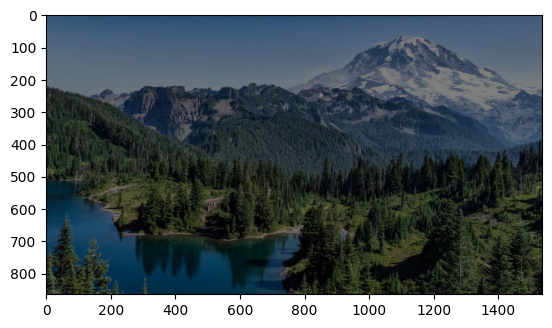

In [26]:
img_brightness = Image.open('drive/MyDrive/Vision/data/1_brightness.jpg')
plt.imshow(img_brightness)

## **Ejercicio 2**<a class="anchor" id="Ejercicio2" ></a>

**Investiga una aplicación donde obtener el negativo de imagen tenga un valor específico e integra el código en en una fila de google collab, justificar brevemente tu investigación y haciendo una demo sencilla.**

La principal aplicación del negativo de una imagen es la apreciación de la misma. Por convención, la mayoría de los algoritmos procesamiento de imagen asumen que el fondo es negro, y lo que hay que detectar es blanco.

Las imagenes negativas pueden tener desde valor artístico, hasta aplicaciones médicas. Dentro de los rayos X, el color negro implica baja densidad, mientras que el blanco una densidad alta. Para los médicos encargados de hacer diagnósticos con los rayos X, por convención, es más fácil visualizar hallazgos cuando la densidad más alta es representada como blanco. A continuación, mostramos un ejemplo de una imagen de rayos X:

<class 'PIL.JpegImagePlugin.JpegImageFile'> width: 3040 height: 4059


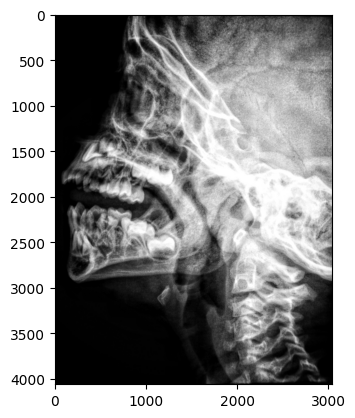

In [27]:
img_x_ray = Image.open('drive/MyDrive/Vision/data/x_ray.jpg')
plt.imshow(img_x_ray)
width, height = img_x_ray.size
print(type(img_x_ray), 'width:', width, 'height:', height)

Seguido, convertimos la imagen a su negativo, y la visualizamos:

In [28]:
negative_img = ImageOps.invert(img_x_ray)
negative_img.save('drive/MyDrive/Vision/data/x_ray_negative.jpg')

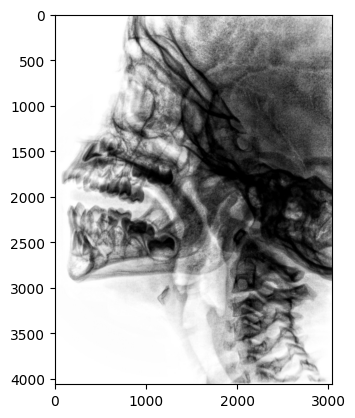

In [29]:
img_x_ray_negative = Image.open('drive/MyDrive/Vision/data/x_ray_negative.jpg')
plt.imshow(img_x_ray_negative)

## **Ejercicio 3**<a class="anchor" id="Ejercicio3" ></a>

**Investiga una aplicación donde se puede aplicar la corrección de gamma en una imagen. Integra el código en en una fila de google collab, justifica brevemente tu investigación y haz una demo sencilla.**

El ojo humano percibe el color y la iluminación diferente a los sensores de las cámaras digitales. En un sensor digital, su relación entre fotones y brillo es linear, mientras que para el ojo humano esta relación no lo es. Por lo que la corrección de gamma es útil para compensar la no linealidad de la relación entre los valores de pixeles y del brillo percibido. Se utiliza para lograr consistencia en el procesamiento de imágenes. Así como para lograr una calibración precisa entre diferentes pantallas de diferentes dispositivos.

A continuación mostramos un ejemplo de su aplicación:

<class 'PIL.JpegImagePlugin.JpegImageFile'> width: 900 height: 600


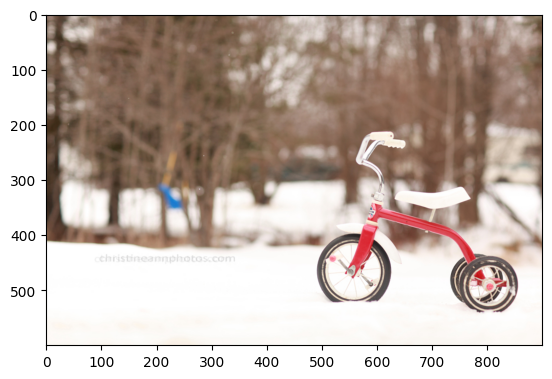

In [30]:
img_gamma = Image.open('drive/MyDrive/Vision/data/gamma.jpg')
plt.imshow(img_gamma)
width, height = img_gamma.size
print(type(img_gamma), 'width:', width, 'height:', height)

Donde observamos una imagen con alto brillo. Por lo que aplicamos un valor de gamma menor a 1:

In [31]:
gamma = 0.5
img_array = np.array(img_gamma)
gamma_corrected_array = (img_array / 255.0) ** (1.0 / gamma) * 255.0
gamma_corrected_img = Image.fromarray(gamma_corrected_array.astype('uint8'))
gamma_corrected_img.save('drive/MyDrive/Vision/data/gamma_corrected.jpg')

Y observamos el resultado:

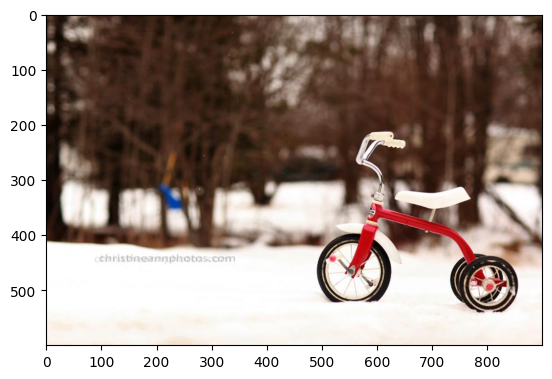

In [32]:
gamma_corrected_img = Image.open('drive/MyDrive/Vision/data/gamma_corrected.jpg')
plt.imshow(gamma_corrected_img)

## **Ejercicio 4**<a class="anchor" id="Ejercicio4" ></a>

**Investiga una aplicación donde se puede usar la sustracción de imágenes e integra el código en en una fila de google collab, justificar brevemente tu investigación, haciendo una demo sencilla.**

La sustracción de imágenes es usada generalmente para la detección de cambios y el seguimiento de objetos. Es una operación pixel a pixel en la que se restan los valores de cada pixel de una imagen vs. otra. El resultado es una imagen donde se resalta la diferencia entre las dos imágenes. Observemos el siguiente ejemplo:

<class 'PIL.JpegImagePlugin.JpegImageFile'> width: 700 height: 467


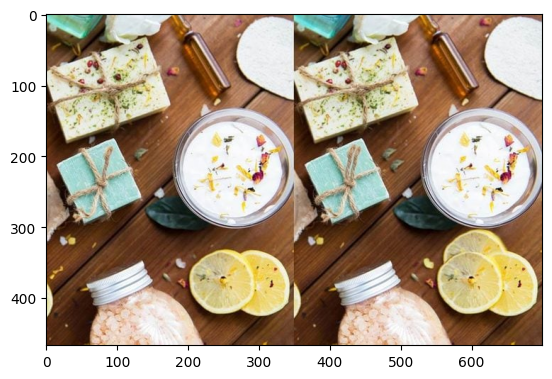

In [33]:
img_differences = Image.open('drive/MyDrive/Vision/data/differences.jpg')
plt.imshow(img_differences)
width, height = img_differences.size
print(type(img_differences), 'width:', width, 'height:', height)

Una imagen, que contiene dos imágenes con ligeras diferencias. Dividamos la imagen a la mitad:

In [34]:
midpoint = width // 2

left_half = img_differences.crop((0, 0, midpoint, height))
left_half.save('drive/MyDrive/Vision/data/differences_left.jpg')

right_half = img_differences.crop((midpoint, 0, width, height))
right_half.save('drive/MyDrive/Vision/data/differences_right.jpg')

(350, 467)


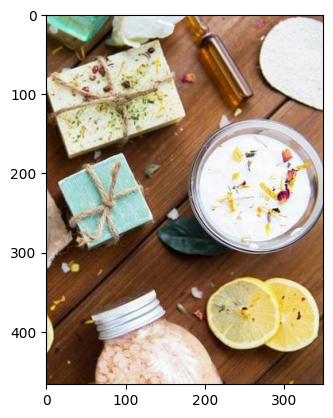

In [35]:
print(left_half.size)
plt.imshow(left_half)

(350, 467)


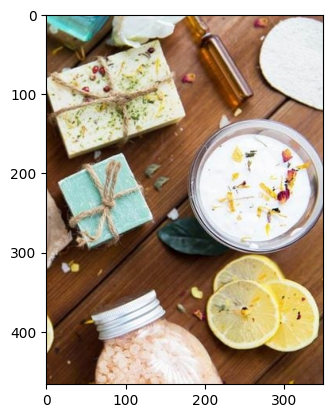

In [36]:
print(right_half.size)
plt.imshow(right_half)

Utilizamos la librería de PIL para hacer la sustracción de imágenes:

In [37]:
from PIL import Image, ImageChops

subtracted_image = ImageChops.subtract(left_half, right_half)

subtracted_image.save('drive/MyDrive/Vision/data/differences_result.jpg')

Y observamos la diferencia:

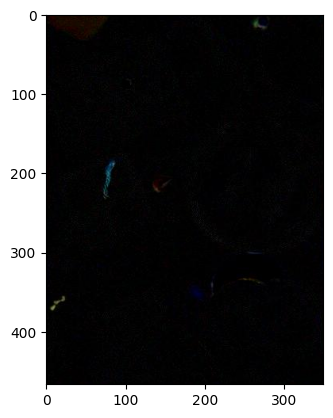

In [38]:
image_subtraction = Image.open('drive/MyDrive/Vision/data/differences_result.jpg')
plt.imshow(image_subtraction)

La comparamos contra la "solución" del problema, y observamos que efectivamente, la sustracción de imágenes resalta la diferencia entre las dos imágenes.

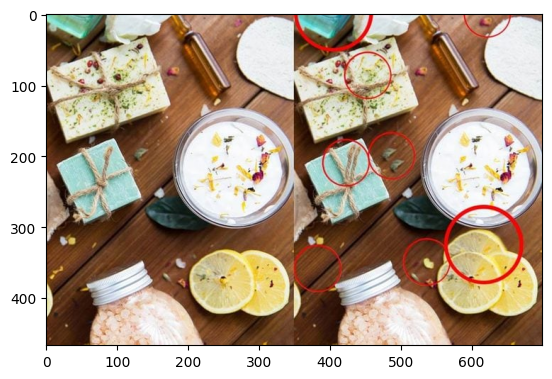

In [39]:
img_differences_solution = Image.open('drive/MyDrive/Vision/data/differences_solution.jpg')
plt.imshow(img_differences_solution)

# **3. Referencias** <a class="anchor" id="Referencias" ></a>

* Bradski, G. (2000). The OpenCV Library. Dr. Dobb&#x27;s Journal of Software Tools.
* Clark, A. (2015). Pillow (PIL Fork) Documentation. readthedocs. Retrieved from https://buildmedia.readthedocs.org/media/pdf/pillow/latest/pillow.pdf
* Gonzalez, R., & Woods, R. (2018). Digital Image Processing. Pearson.
* Hunter, J. D. (2007). Matplotlib: A 2D graphics environment. Computing in Science &amp; Engineering, 9(3), 90–95.
* Khanal, S. (2020). Negative Image. Obtenido de Medium: https://samirkhanal35.medium.com/negative-image-6cb7d5edcb54
* Rosebrock , A. (2015). OpenCV Gamma Correction. Obtenido de Pyimagesearch: https://pyimagesearch.com/2015/10/05/opencv-gamma-correction/#:~:text=There%20are%20two%20(easy)%20ways,range%20%5B0%2C%20255%5D